# Unsupervised Learning

### Topics
1. **Types** of unsupervised learning
2. **Challenges** in unsupervised learning
3. **Feature scaling** - why & how (Standard, Min-Max, Robust)
4. **Dimensionality reduction** (main focus)
   * PCA (linear)
   * Truncated SVD for sparse/text like TF-IDF
   * t-SNE (non-linear, manifold)
   * UMAP (non-linear, faster than t-SNE)
5. Hands-on demos with **pipelines** & **ColumnTransformers**


## 1  Types of Unsupervised Learning

| Category | Typical Goal | Examples |
|----------|--------------|----------|
| **Clustering** | group similar observations | k-means, DBSCAN, Agglomerative HC |
| **Dimensionality Reduction** | compress/visualize features | PCA, t-SNE, UMAP, Autoencoders |
| **Density Estimation** | estimate pdf | Gaussian Mixture Models |
| **Association Rules** | discover co-occurrence | Apriori, FP-Growth |

We will **focus on dimensionality reduction** because it is often the gateway step before clustering/visualisation.

- **PDF (Probability Density Function)**: Describes the likelihood of a random variable taking a specific value.

- **Estimating the PDF**:
  - **Histogram**: Simple, but sensitive to bin size.
  - **Kernel Density Estimation (KDE)**: Smooth, continuous estimate using a kernel (e.g., Gaussian).
  - **Parametric Methods**: Assumes a specific distribution (e.g., normal) and estimates parameters.

- **Gaussian Mixture Model (GMM)**:
  - A **parametric model**: Models data as a mixture of multiple Gaussian distributions.
  - **Formula**: $( p(x) = \sum_{i=1}^{K} w_i \cdot p(x | \mu_i, \sigma_i^2) )$, where $(w_i), (\mu_i)$, and $(\sigma_i^2)$ are the weights, means, and variances of each Gaussian component.
  
- **Fitting a GMM**:
  - Uses **Expectation-Maximization (EM)**:
    1. **E-step**: Estimate probabilities that each data point belongs to each Gaussian.
    2. **M-step**: Update parameters (mean, variance, and weight) based on the data.

- **Advantages of GMM for PDF Estimation**:
  - **Flexible**: Can model complex, multi-modal distributions (multiple peaks).
  - **Powerful**: Can describe data from distinct sub-populations, useful for clustering or anomaly detection.


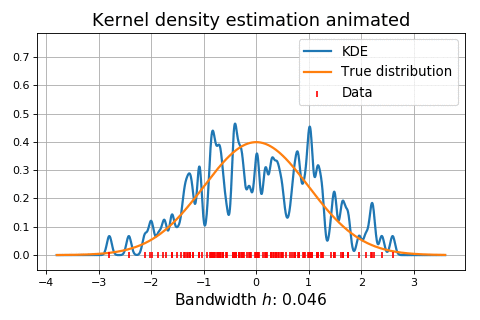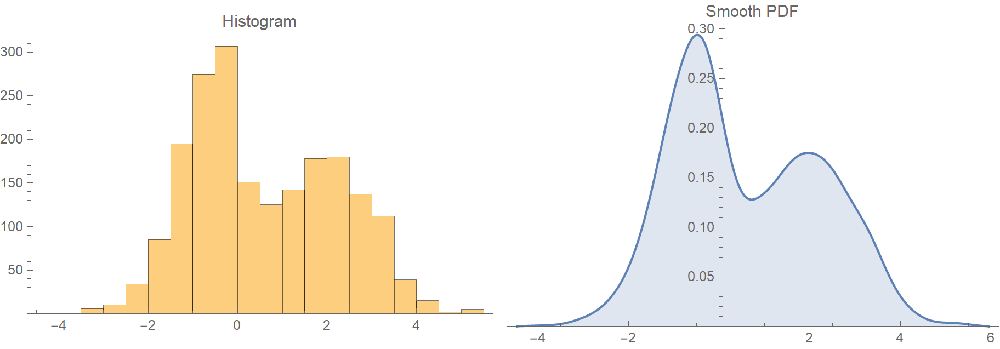

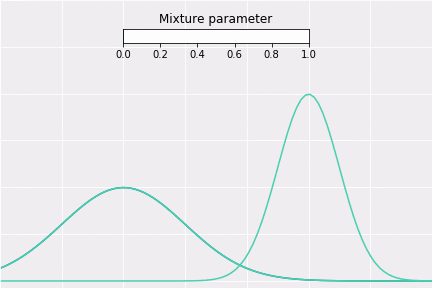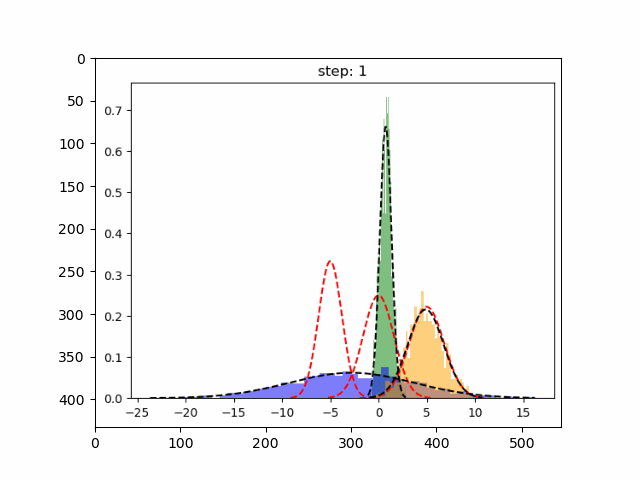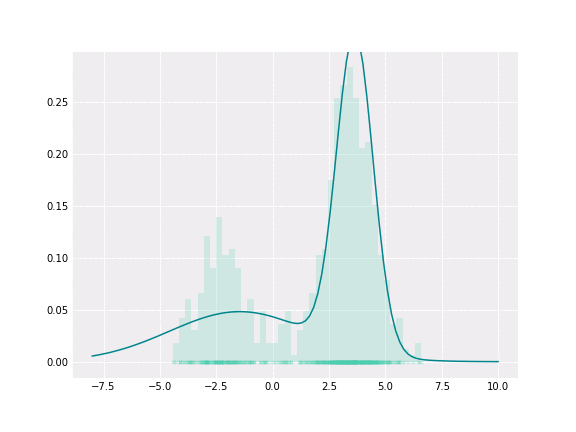

## 2  Challenges in Unsupervised Learning
1. **No labels ⇒ no ground-truth** - hard to evaluate (use intrinsic metrics, domain knowledge).  
2. **Determining the “right” number of clusters/components**.  
3. **Scale & units** heavily influence distance-based methods.  
4. Curse of **dimensionality** – distance concentration, sparsity.  
5. **Interpretability** of learned structure.  
6. **Computational cost** for very large/high-dimensional data.


## 3  Feature Scaling
`sklearn.preprocessing` offers several scalers:
* **StandardScaler** – zero mean, unit variance (assumes Gaussian-ish).
* **MinMaxScaler** – rescales to [0, 1] (sensitive to outliers).
* **RobustScaler** – uses median & IQR (robust to outliers).

Scaling is crucial **before** PCA, t-SNE, UMAP, k-means, etc., because these algorithms rely on distance or variance.

### IQR (Interquartile Range)

**IQR** stands for **Interquartile Range**, which is a measure of statistical dispersion or spread. It is used to describe the middle 50% of values in a dataset and is particularly **robust to outliers** because it focuses on the central portion of the data rather than the extremes.

#### IQR Definition:
- The IQR is the difference between the **third quartile (Q3)** and the **first quartile (Q1)**:
  

  $\text{IQR} = Q3 - Q1$


- **Q1 (First Quartile)**: The value that separates the lowest 25% of the data.
- **Q3 (Third Quartile)**: The value that separates the lowest 75% of the data.

#### How It Works:
- The **IQR** represents the range within which the central 50% of the data points lie.
- Since it ignores the extreme values (the minimum and maximum), it is **robust to outliers**, making it a good tool for data distributions that may include extreme values that would skew other measures like the mean or standard deviation.

#### Example:
- **Data**: 1, 3, 5, 7, 9, 11, 13
- **Q1**: 3
- **Q3**: 11
- **IQR**: \( 11 - 3 = 8 \)

Thus, the IQR for this dataset would be 8.

#### Use of IQR:
- **Robust Estimation**: When combined with the median, the IQR is often used for robust statistics because it is less sensitive to extreme values (outliers) than other measures like the mean and standard deviation.
- **Outlier Detection**: IQR is also used for identifying outliers. Typically, data points outside of the range $ [Q1 - 1.5 \times \text{IQR}, Q3 + 1.5 \times \text{IQR}] $ are considered outliers.

This makes the IQR a very useful tool for working with skewed or contaminated data.


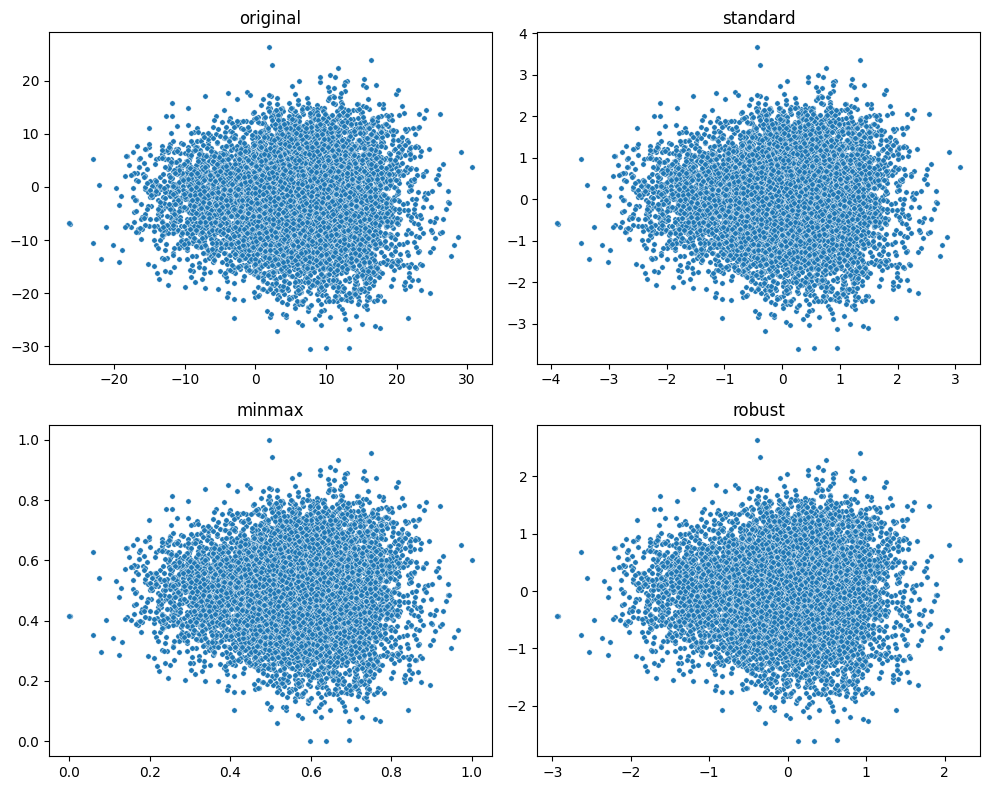

In [ ]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
from sklearn import datasets
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Example: compare scaling effects on a numeric toy dataset
X, _ = datasets.make_blobs(n_samples=8000, centers=5, cluster_std=6, random_state=4)
df = pd.DataFrame(X, columns=["feat1","feat2"])
scalers = {
    "original": None,
    "standard": StandardScaler(),
    "minmax":   MinMaxScaler(),
    "robust":   RobustScaler()
}
plt.figure(figsize=(10,8))
for i,(name,scaler) in enumerate(scalers.items(),1):
    if scaler is None:
        data = X
    else:
        data = scaler.fit_transform(X)
    plt.subplot(2,2,i)
    sns.scatterplot(x=data[:,0], y=data[:,1], s=15)
    plt.title(name)
plt.tight_layout()
plt.show()

## 4  Dimensionality Reduction (Main Focus)
### 4.1 Principal Component Analysis (PCA)
* Linear projection maximizing **variance**.(greatest spread)  
* Components are orthogonal.  
* Good for compressing numeric data, visualising 2-D scatter of high-D data.

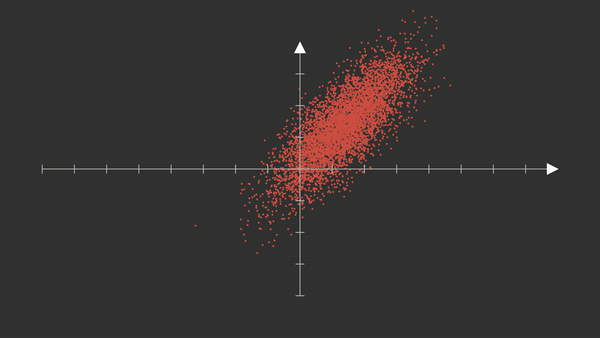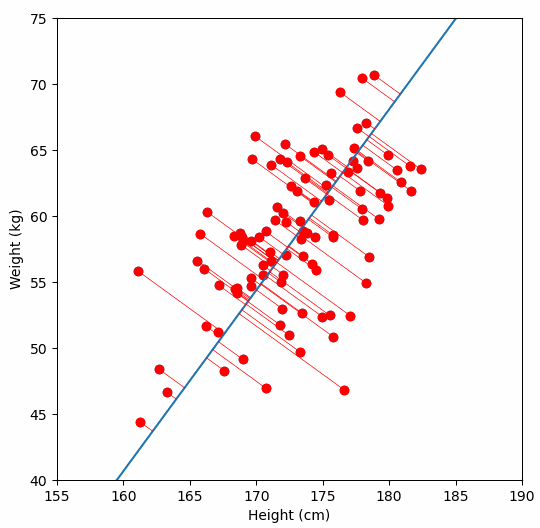

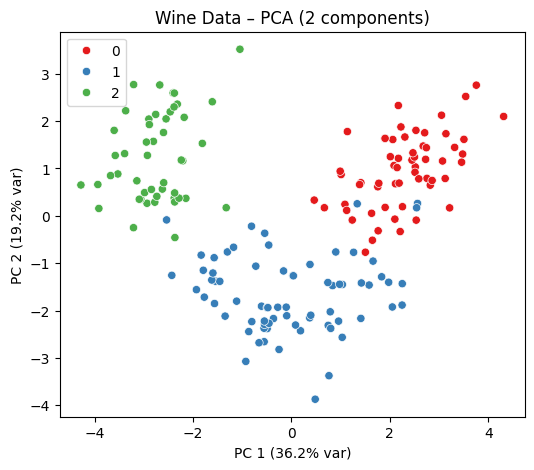

In [ ]:
from sklearn.decomposition import PCA
from sklearn.datasets import load_wine
wine = load_wine()
X = wine.data
y = wine.target

# Pipeline: scale then PCA to 2 comps, visualise
pipe_pca = Pipeline([
    ("scaler", StandardScaler()),
    ("pca", PCA(n_components=2, random_state=2))
])
X_pca = pipe_pca.fit_transform(X)
plt.figure(figsize=(6,5))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=y, palette="Set1")
plt.title("Wine Data – PCA (2 components)")
plt.xlabel("PC 1 ({:.1f}% var)".format(pipe_pca[-1].explained_variance_ratio_[0]*100))
plt.ylabel("PC 2 ({:.1f}% var)".format(pipe_pca[-1].explained_variance_ratio_[1]*100))
plt.show()

### 4.2 Truncated SVD (Latent Semantic Analysis for sparse data)
Often used with TF-IDF text matrices because PCA is expensive for sparse input.Using the best separation of classes instead of maximizing variance.


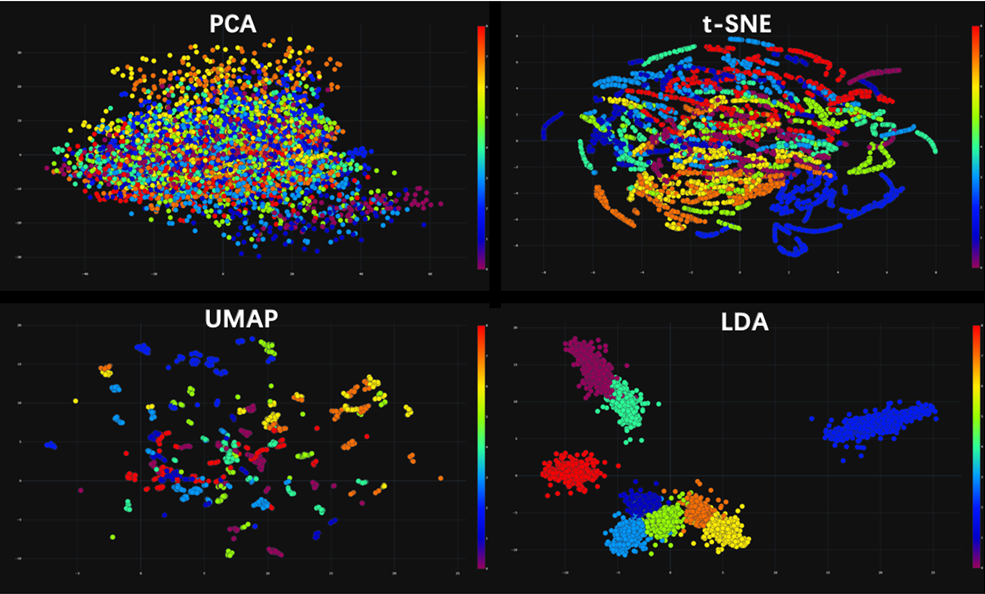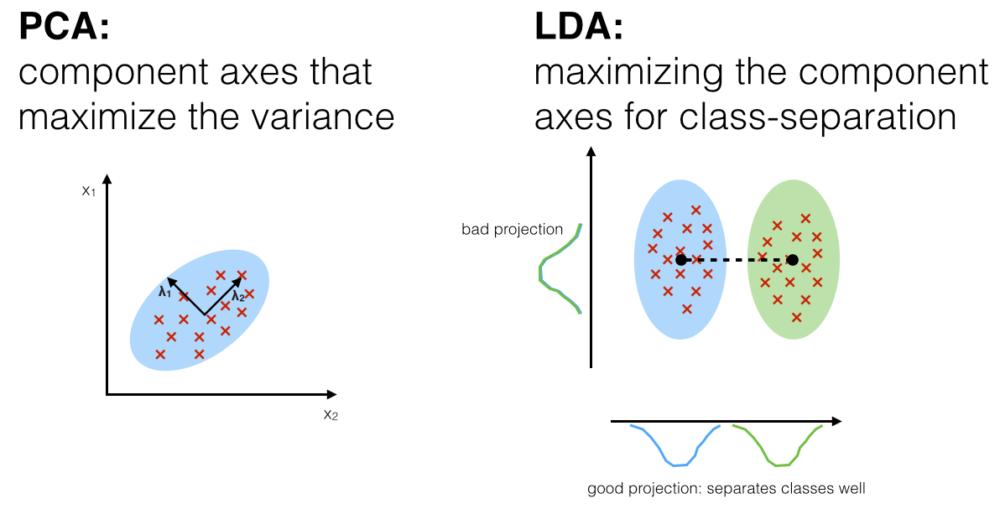

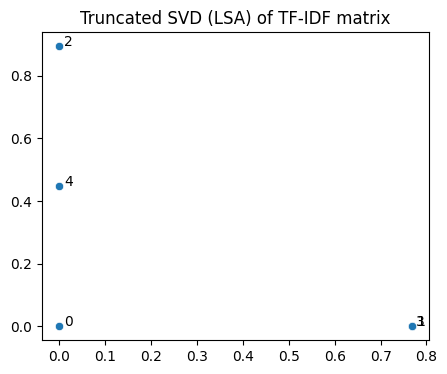

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

docs = [
 "SVMs support vector machines are powerful",
 "Decision trees are easy to interpret",
 "Deep learning uses neural networks",
 "Random forests are ensembles of trees",
 "Gradient boosting builds models sequentially"
]
tfidf = TfidfVectorizer(stop_words="english")
X_tfidf = tfidf.fit_transform(docs)

svd = TruncatedSVD(n_components=2, random_state=42)
X_svd = svd.fit_transform(X_tfidf)
plt.figure(figsize=(5,4))
sns.scatterplot(x=X_svd[:,0], y=X_svd[:,1])
for i,txt in enumerate(range(len(docs))):
    plt.text(X_svd[i,0]+0.01, X_svd[i,1], str(i))
plt.title("Truncated SVD (LSA) of TF-IDF matrix")
plt.show()

### 4.3 t-SNE (t-Distributed Stochastic Neighbor Embedding)
* Non-linear; preserves **local neighbourhoods**.  
* Computationally heavier (O(n²)).  
* Great for 2-D visualisation but **not** for downstream linear models.

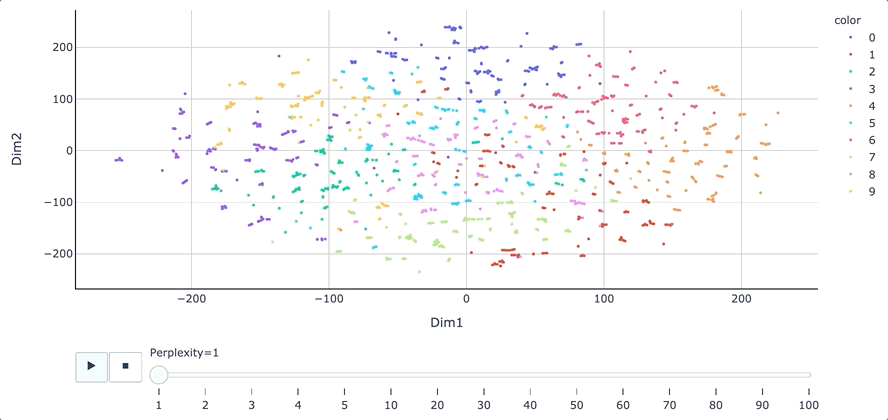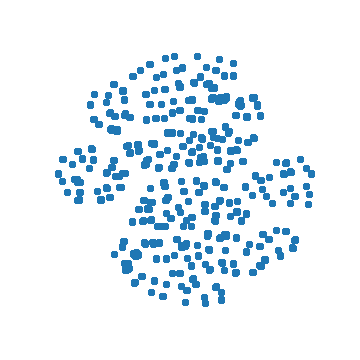

In [ ]:
from sklearn.manifold import TSNE
X_tsne = TSNE(n_components=2, perplexity=3, learning_rate="auto", init="pca", random_state=3).fit_transform(X)
plt.figure(figsize=(6,5))
sns.scatterplot(x=X_tsne[:,0], y=X_tsne[:,1], hue=y, palette="Set1", s=40)
plt.title("Wine Data – t-SNE 2-D")
plt.show()

KeyboardInterrupt: 

### 4.4 UMAP (Uniform Manifold Approximation & Projection)
* Similar goal as t-SNE but **faster** and often preserves more global structure.
* Implementation from `umap-learn`.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


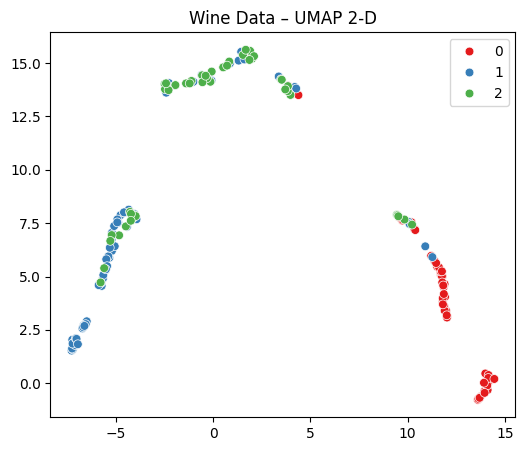

In [ ]:
!pip install --quiet umap-learn
import umap.umap_ as umap
umap_2d = umap.UMAP(n_components=2, random_state=2)
X_umap = umap_2d.fit_transform(X)
plt.figure(figsize=(6,5))
sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=y, palette="Set1", s=40)
plt.title("Wine Data – UMAP 2-D")
plt.show()

## 5  Pipeline with ColumnTransformer Example
We’ll simulate a mixed dataset (numeric + categorical), scale numeric features, one-hot encode categorical ones, then reduce dimension with **PCA** and visualise.

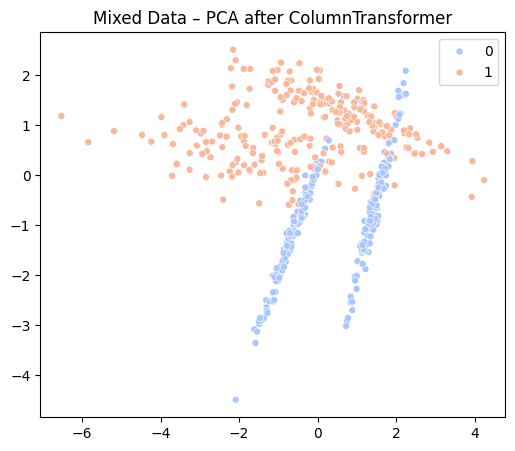

In [ ]:
from sklearn.datasets import make_classification
from sklearn.preprocessing import OneHotEncoder
# create numeric data then add a categorical column
X_num, y_bin = make_classification(n_samples=500, n_features=5, random_state=42)
cat = np.random.choice(["low","medium","high"], size=(500,1))
X_mix = np.hstack([X_num, cat])
cols = [f"num{i}" for i in range(5)] + ["quality"]
df_mix = pd.DataFrame(X_mix, columns=cols)

# pipeline
num_cols = cols[:5]
cat_cols = ["quality"]

pre = ColumnTransformer([
    ("num", StandardScaler(), num_cols),
    ("cat", OneHotEncoder(sparse_output=False, handle_unknown="ignore"), cat_cols)
])
pipe = Pipeline([
    ("pre", pre),
    ("pca", PCA(n_components=2, random_state=42))
])
X_red = pipe.fit_transform(df_mix)
plt.figure(figsize=(6,5))
sns.scatterplot(x=X_red[:,0], y=X_red[:,1], hue=y_bin, palette="coolwarm", s=25)
plt.title("Mixed Data – PCA after ColumnTransformer")
plt.show()

## 6  Key Takeaways
* **Feature scaling** is mandatory for distance-based unsupervised methods.
* **PCA**: linear, fast, interpretable via variance explained.
* **t-SNE & UMAP**: non-linear, great for visualisation; UMAP generally faster.
* **Truncated SVD** operates directly on sparse matrices (text).
* Choose the method based on goal: compression vs. visualisation vs. downstream modelling.

### Challenges Recap
Remember: evaluation is intrinsic, no ground-truth labels. Rely on domain knowledge, silhouette scores, reconstruction error, etc.
